In [ ]:
import cv2 
from google.colab.patches import cv2_imshow # colab alternative to cv2.imshow() 
import numpy as np
import matplotlib.pyplot as plt

COORDINATE SYSTEM

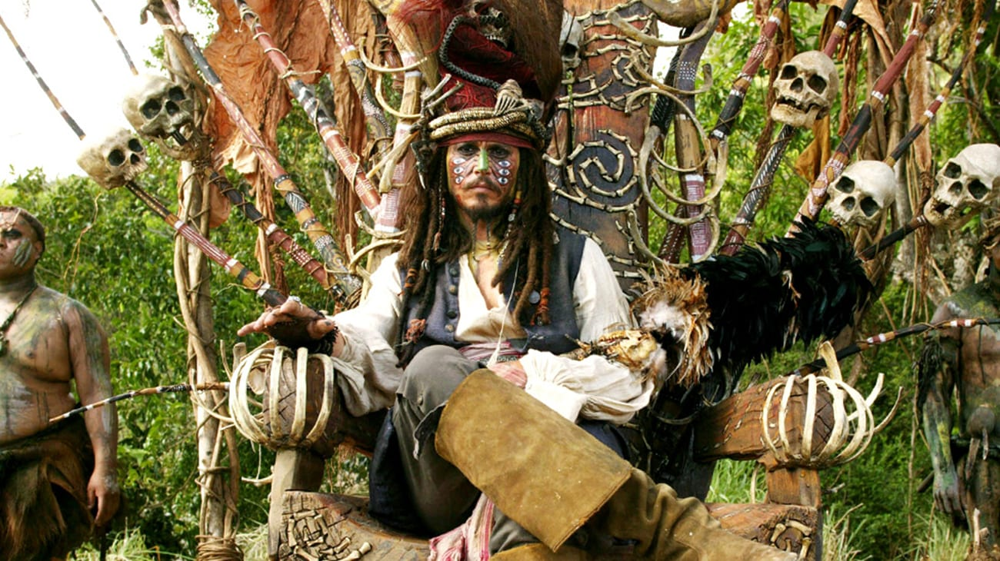

In [ ]:
myimg=cv2.imread("/content/pirates.jpeg")
cv2_imshow(myimg) 
# use cv.imshow() in local system.

In [ ]:
# dimensions and channels
# height, width, channels.
myimg.shape

(730, 1300, 3)

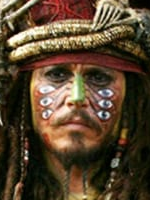

In [ ]:
## coordinate system.
cv2_imshow(myimg[120:320, 550:700]) ## cropping  a particular area from the image

In [ ]:
# blue channel only shape
myimg[:,:,0].shape  
# myimg[:,:,1] - selecting green channel
# myimg[:,:,2] - selecting red channel

# Remember in OpenCV the channels are taken in the order BGR.

(730, 1300)

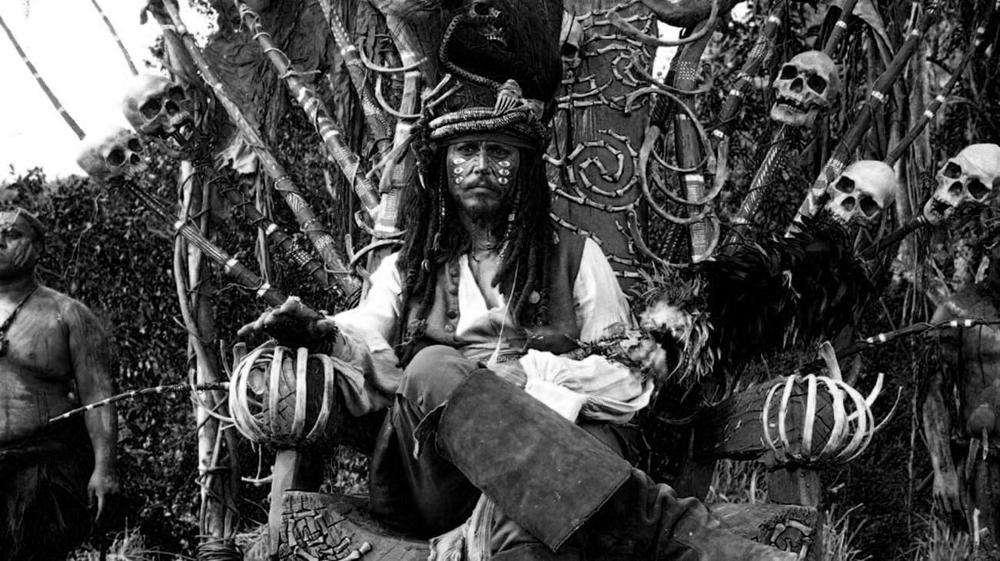

In [ ]:
## view blue channel only.
cv2_imshow(myimg[:,:,0])

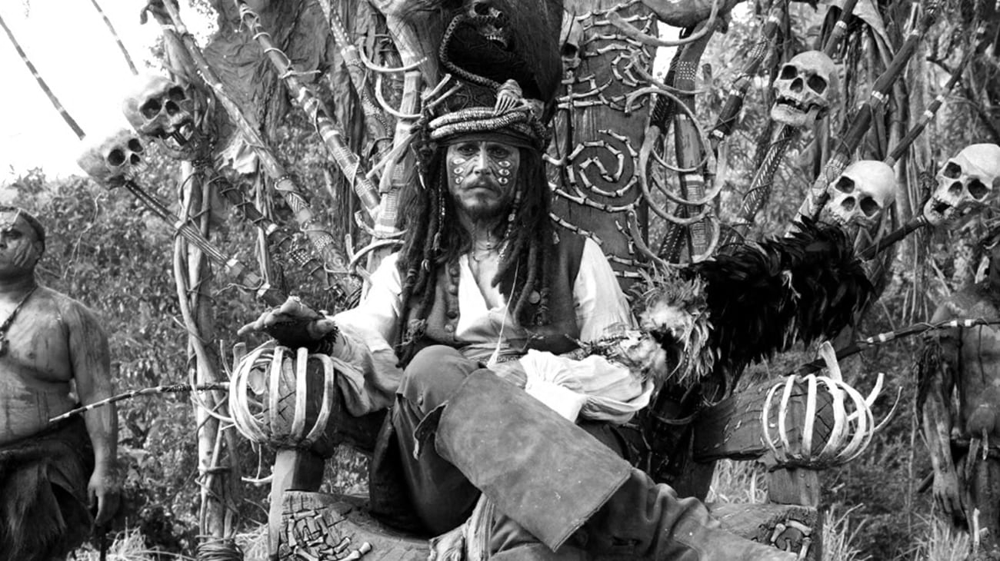

In [ ]:
## view green channel only.
cv2_imshow(myimg[:,:,1])

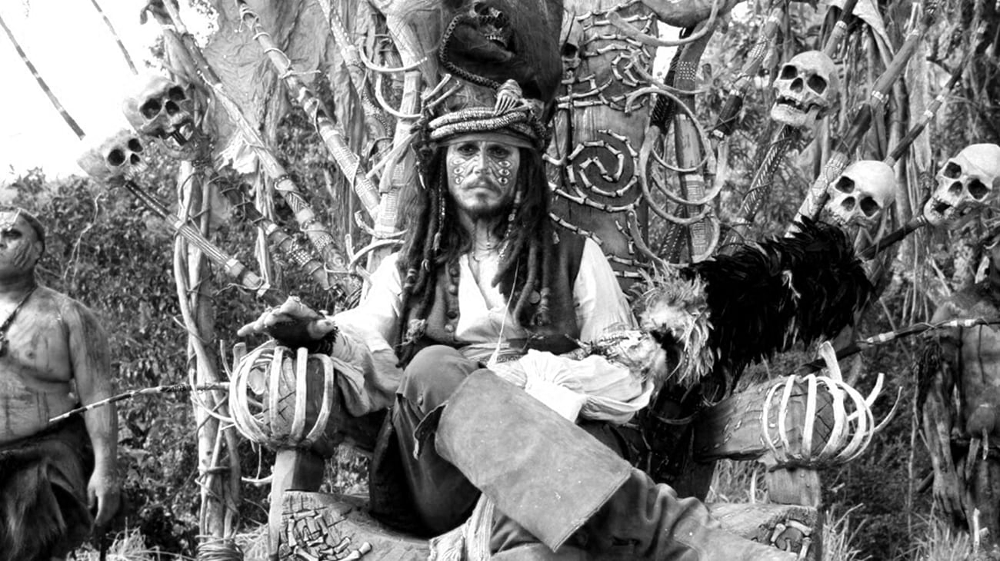

In [ ]:
## view red channel only.
cv2_imshow(myimg[:,:,2])

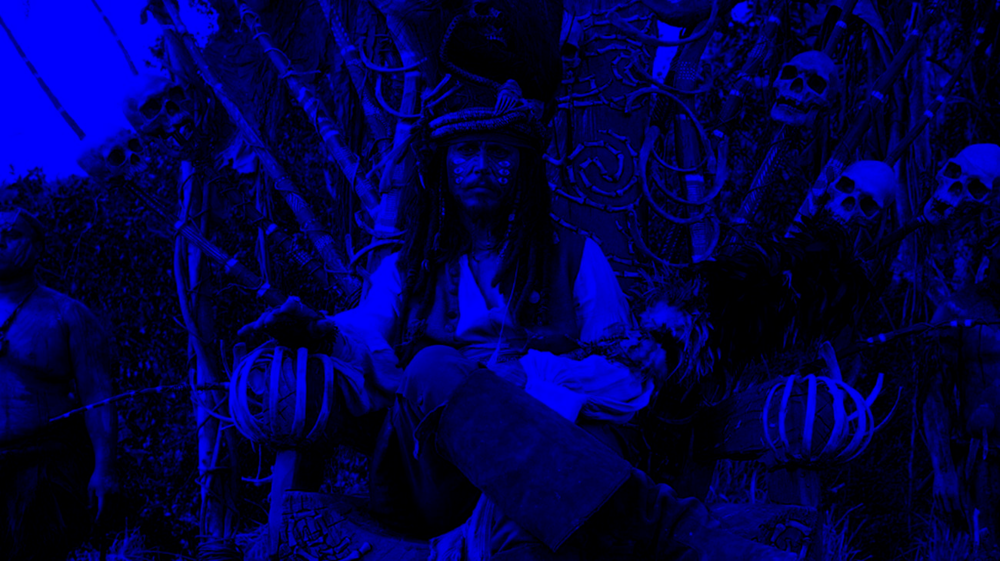

In [ ]:
# For viewing blue channel in blue colour.
# create empty image with same shape as that of source image
blue_img = np.zeros(myimg.shape)

#assign the blue channel of src to empty image
blue_img[:,:,0] = myimg[:,:,0]

cv2_imshow(blue_img)

RESIZE

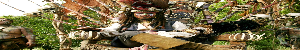

In [ ]:
## resize
cv2_imshow(cv2.resize(myimg, (300, 50))) 

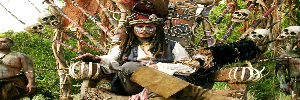

In [ ]:
cv2_imshow(cv2.resize(myimg, (300, 100)))

TRANSLATION

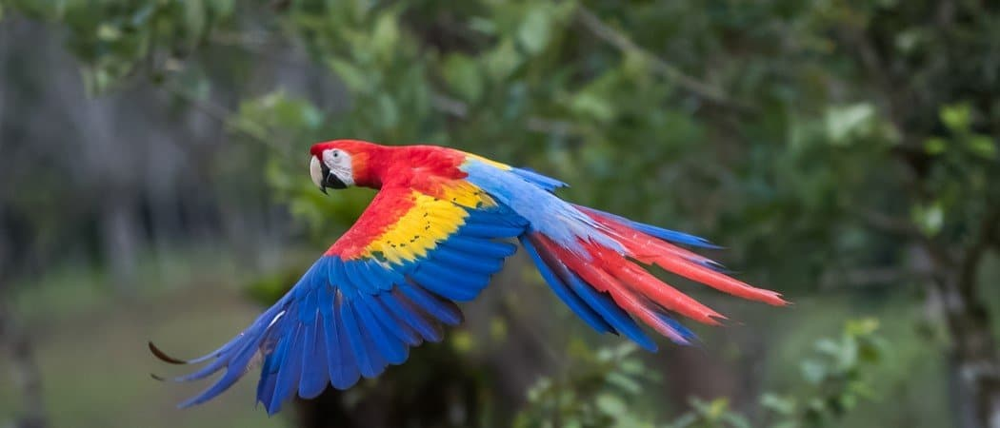

In [ ]:
## 2 - Translation
## Translation is the shifting of an image along the x and y
# axis. Using translation, we can shift an image up, down,
# left, or right, along with any combination of the above.

img2 =cv2.imread("/content/bird.jpg")
cv2_imshow(img2)


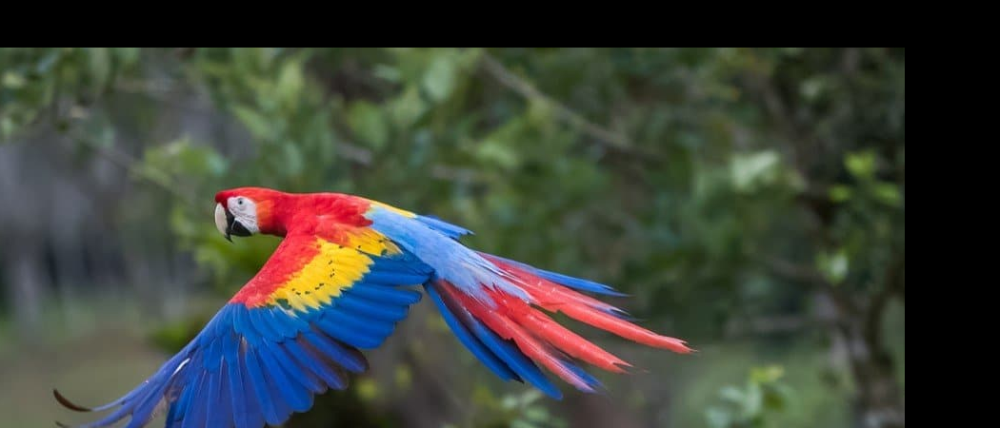

In [ ]:
trans = np.float32([[1, 0, -100], [0, 1, 50]])
"""
We first define our translation matrix 'trans'. This matrix tells us how
many pixels to the left or right, and up or down, the image
will be shifted. Our translation matrix 'trans' is defined as a floating point
array – this is important because OpenCV expects this matrix 
to be of floating point type. The first row of the matrix
is [1, 0, tx], where tx is the number of pixels we will shift
the image left or right. Negative values of tx will shift the
image to the left and positive values will shift the image to
the right.
Then, we define the second row of the matrix as [0, 1, ty],
where ty is the number of pixels we will shift the image up
or down. Negative value of ty will shift the image up and
positive values will shift the image down.
"""
shifted = cv2.warpAffine(img2, trans, (img2.shape[1], img2.shape[0]))
cv2_imshow(shifted)

ROTATION

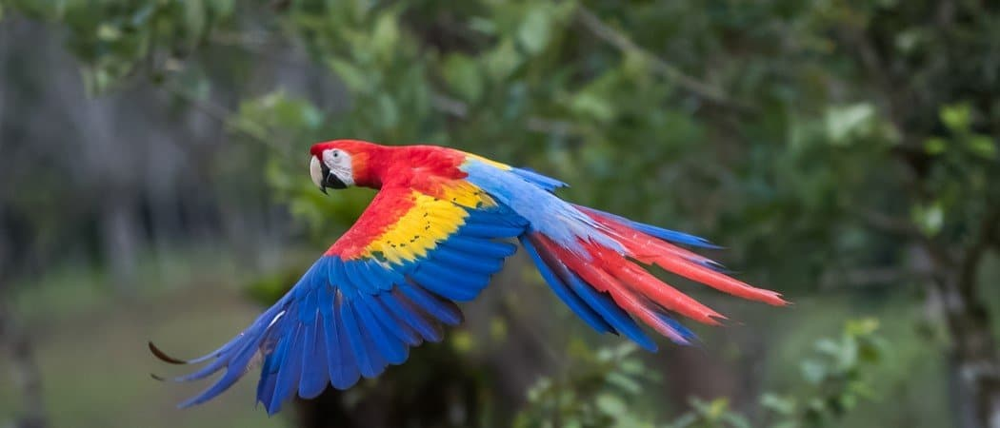

In [ ]:
# Rotation
img3= cv2.imread("/content/bird.jpg")
cv2_imshow(img3)

(450, 1050, 3)


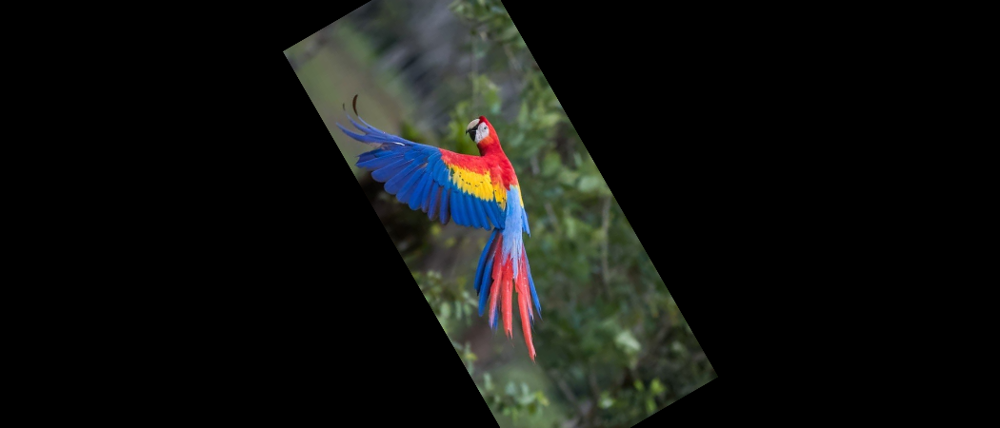

In [ ]:
print(img3.shape)
# find center of the image.
(h, w) = img3.shape[:2]
c = (w//2, h//2)
r = cv2.getRotationMatrix2D(c, -60, 0.5)
"""
cv2.getRotationMatrix2D function takes three arguments: 
the point at which we want to rotate the image
around (in this case, the center of the image). We then
specify θ, the number of degrees we are going to rotate the
image by. In this case, we are going to rotate the image 45
degrees. The last argument is the scale of the image. Here you can
specify a floating point value, where 1.0 means the same di
mensions of the image are used. However, if you specified
a value of 2.0 the image would be doubled in size. Similarly,
a value of 0.5 halves the size of the image.
"""
rotated = cv2.warpAffine(img3, r, (w, h))
cv2_imshow(rotated)

RESIZE WITH KEEPING ASPECT RATIO

resized shape: (200, 100, 3)


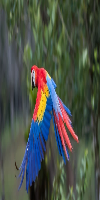

In [ ]:
## 4- Resizing
## without aspect ratio (already tried earlier)
resized = cv2.resize(img2, (100,200))
print("resized shape:", resized.shape)
cv2_imshow(resized)

(450, 1050, 3)
resized shape: (85, 200, 3)


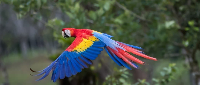

In [ ]:
## 4 - Resizing
## with aspect ratio
"""
When resizing an image, we need to keep in mind
the aspect ratio of the image. The aspect ratio is the proportional 
relationship of the width and the height of the image.
If we aren’t mindful of the aspect ratio, our resizing will
return results that don’t look correct.
"""
print(img2.shape)
## with width = 200 px
aspect= 200 / img2.shape[1]
d = (200, int(img2.shape[0] * aspect))
resized = cv2.resize(img2, d, interpolation = cv2.INTER_LINEAR)
"""
interpolation method - algorithm working behind the scenes to handle how the
actual image is resized.  other choices include cv2.INTER_LINEAR,cv2.INTER_CUBIC, and cv2.INTER_NEAREST.
"""
print("resized shape:", resized.shape)
cv2_imshow(resized)

(450, 1050, 3)
resized shape: (200, 466, 3)


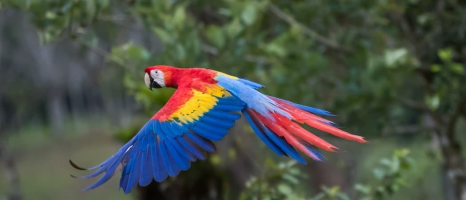

In [ ]:
## Another example.
## Here let's make the height constant.
print(img2.shape)
## with height = 200 px
aspect= 200 / img2.shape[0]
d = (int(img2.shape[1] * aspect), 200)
resized = cv2.resize(img2, d, interpolation = cv2.INTER_AREA) # Let's take another interpolation method INTER_AREA.
print("resized shape:", resized.shape)
cv2_imshow(resized)

FLIPPING

Horizontal flip


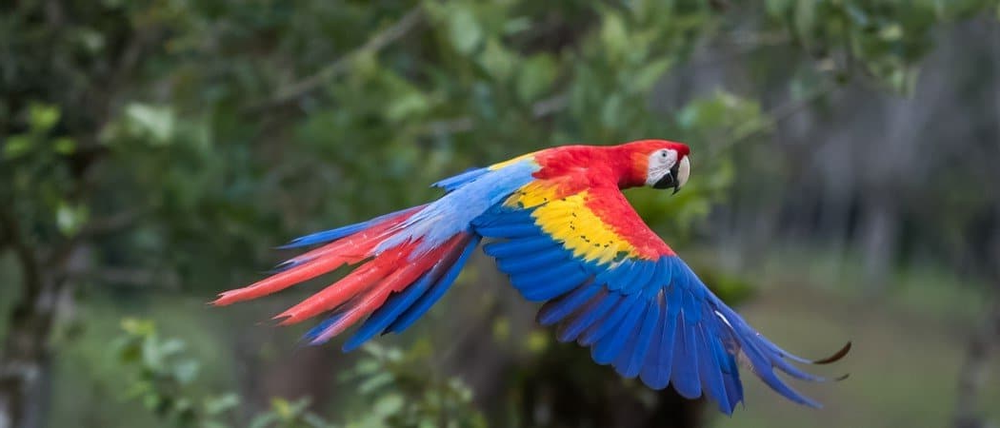

In [ ]:
## 5 - Flipping

flipped = cv2.flip(img2, 1)
"""
1 -flip the image horizontally, around the y-axis.
0- flip the image vertically, around the x-axis 
-1- flips the image around both axes.
"""
print("Horizontal flip")
cv2_imshow(flipped)

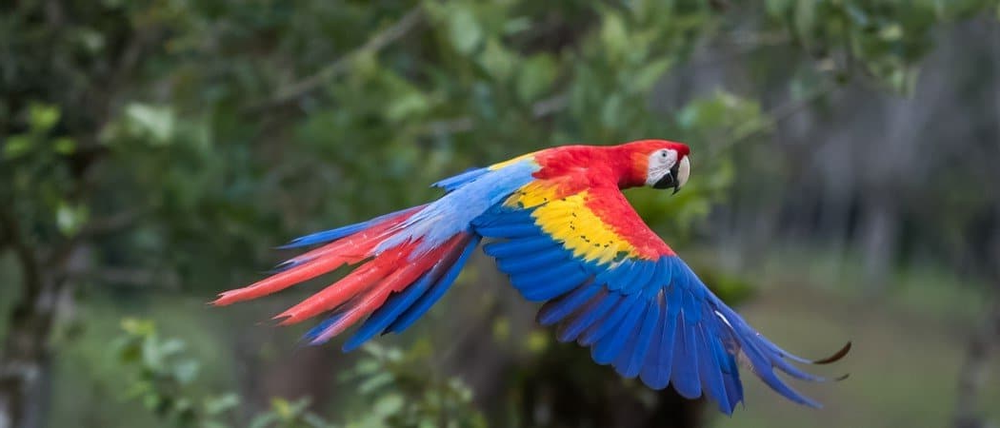

flip horizontal


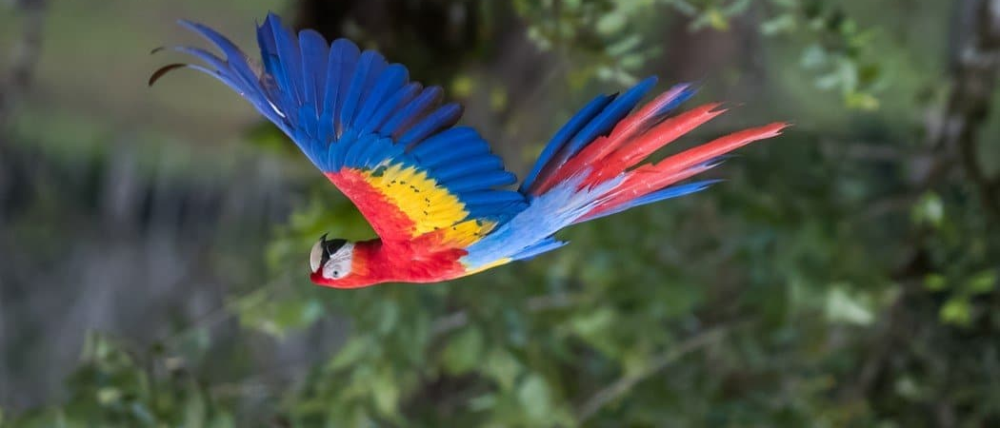

flip vertical


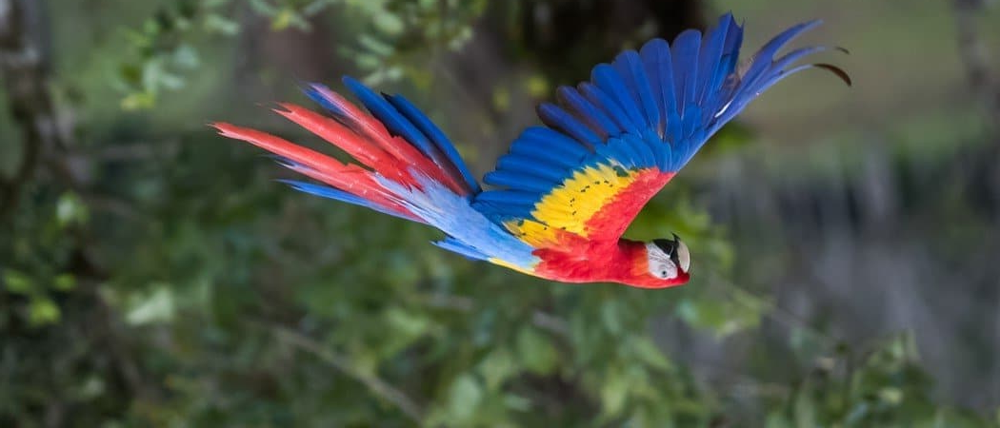

flip both


In [ ]:
### All flipping in one cell.
f1 = cv2.flip(img2, 1)
f2 = cv2.flip(img2, 0)
f3 = cv2.flip(img2, -1)
cv2_imshow(f1)
print("flip horizontal")
cv2_imshow(f2)
print("flip vertical")
cv2_imshow(f3)
print("flip both")

IMAGE ARITHMETIC

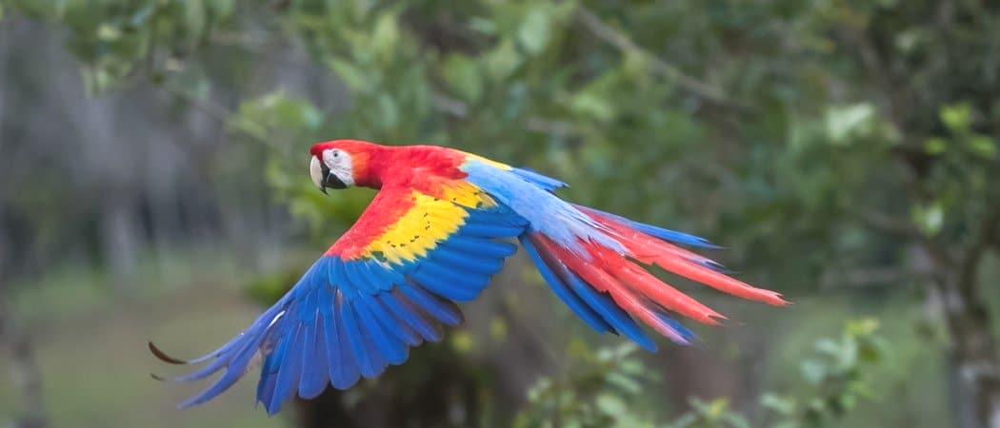

added image


In [ ]:
## IMAGE ARITHMETIC

## About addition, subtraction  etc
## 8 bit - 0 to 255 values.
## 200 value + 150 ==> 350 value not taken in 8 bit.

mt = np.ones(img3.shape, dtype = "uint8") * 20
## mt is the array of ones created for adding with the original image.
## "*20" becomes an array of 20s.
addition= cv2.add(img3, mt)  # .add method is used here.
cv2_imshow(addition)  
print("added image")
## See the change - the image became more brighter. Meaning,
## its pixel intensities increased.

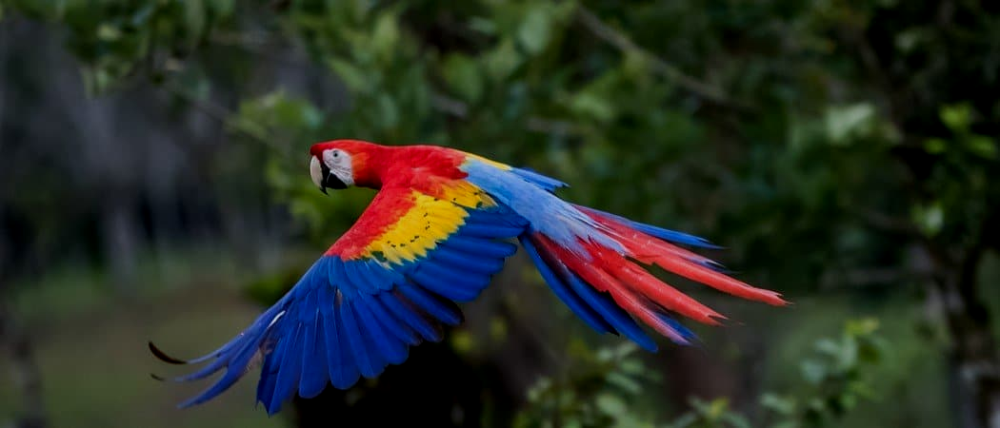

subtracted img


In [ ]:
mt = np.ones(img3.shape, dtype = "uint8") * 37
sub= cv2.subtract(img3, mt) ## .subtract method is used here.
cv2_imshow(sub)
print("subtracted img")
## gone more darker

SOME PRACTICAL CONSIDERATIONS

Let's say we are working with a computer vision problem statement where we need to preprocess thousands of images. You want to input the images in particular way for building a model.

Eg: Creating a function for preprocessing images for training purpose. You need to maintain the aspect ratio by taking the height constant and resize it, the do subraction arithmetic to and finally rotate the image.

In [ ]:
def preprocessing(imgpath, ar_h, s, theta):
  #ar_h - aspect ratio keeping height constant
  # s - subtracted intensity value.
  # theta - rotated angle
  img=cv2.imread(imgpath)
  aspect= ar_h / img.shape[0]
  d = (int(img.shape[1] * aspect), ar_h)
  resized = cv2.resize(img, d, interpolation = cv2.INTER_AREA)
  ## subtract
  mt = np.ones(resized.shape, dtype = "uint8") * s
  sub= cv2.subtract(resized, mt)
  ## rotate
  # find center of the image.
  (h, w) = sub.shape[:2]
  c = (w//2, h//2)
  r = cv2.getRotationMatrix2D(c, theta, 1)
  rotated = cv2.warpAffine(sub, r, (w, h))
  cv2_imshow(rotated)
  print("actual dim:", img.shape, "resized shape:", resized.shape, "subtracted value: ",theta )


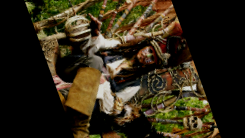

actual dim: (730, 1300, 3) resized shape: (138, 245, 3) subtracted value:  -70


In [ ]:
## Example
preprocessing("/content/pirates.jpeg", 138, 41, -70)

BITWISE OPERATIONS

In [ ]:
## BITWISE OPERATIONS

# We will review four bitwise operations: AND, OR,
# XOR, and NOT.

"""
1. AND: A bitwise AND is true if and only if both pixels
are greater than zero.
2. OR: A bitwise OR is true if either of the two pixels
are greater than zero.
3. XOR: A bitwise XOR is true if and only if either of the
two pixels are greater than zero, but not both.
4. NOT: A bitwise NOT inverts the “on” and “off” pixels
in an image
"""

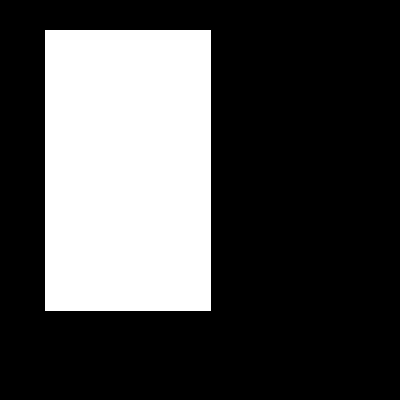

image 1 (400, 400, 3)


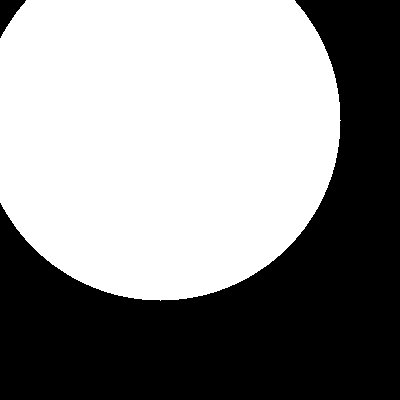

image 2 (400, 400, 3)


In [ ]:
im1 = cv2.imread("/content/r.png")
im2 = cv2.imread("/content/c.png")

cv2_imshow(im1)
print("image 1", im1.shape)

cv2_imshow(im2)
print("image 2", im2.shape)


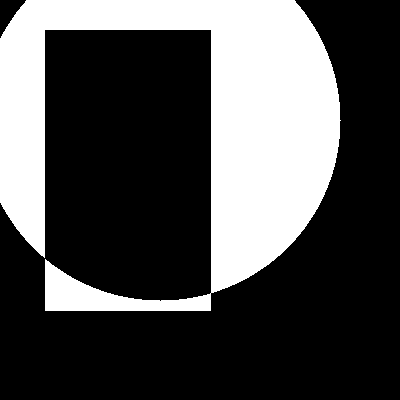

In [ ]:
bitop = cv2.bitwise_xor(im1, im2)
cv2_imshow(bitop)

# try the following.
# bitwise_and
# bitwise_or
# bitwise_xor
# bitwise_not  ## eg: cv2.bitwise_not(im1)

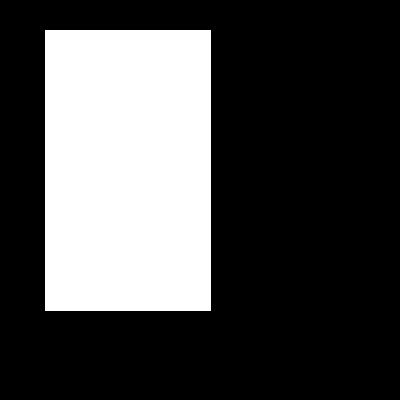

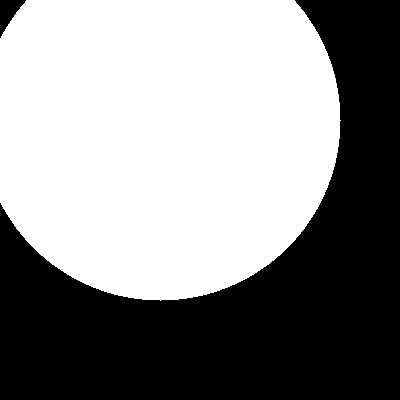

In [ ]:
## 
rectangle = np.zeros((400, 400), dtype = "uint8") ## data type can be unsigned integer.
cv2.rectangle(rectangle, (45, 30), (210, 310), 255, -1)
## "cv2.rectangle()"  - used to draw rectangles.
cv2_imshow(rectangle)
circle = np.zeros((400, 400), dtype = "uint8")
cv2.circle(circle, (160, 120), 180, 255, -1)
cv2_imshow(circle)

MASKING

In [ ]:
## Masking

##Using a mask allows us to focus only on the portions of
# the image that interests us.

In [ ]:
image=cv2.imread("/content/pirates.jpeg")
# print(image.shape)                                                                                                               )
mask=cv2.imread("/content/c.png",0)
print(mask.shape)

(400, 400)


In [ ]:
image_res=cv2.resize(image, (400,400))
image_res.shape

(400, 400, 3)

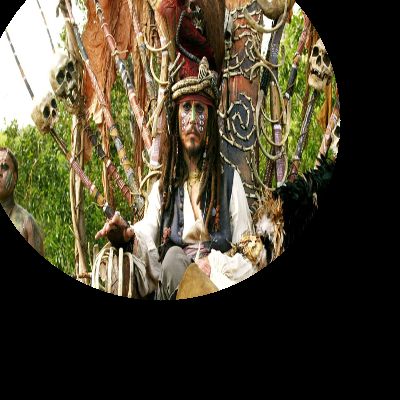

In [ ]:
masked = cv2.bitwise_and(image_res, image_res, mask = mask)
cv2_imshow(masked)

SPLITTING AND MERGING CHANNELS

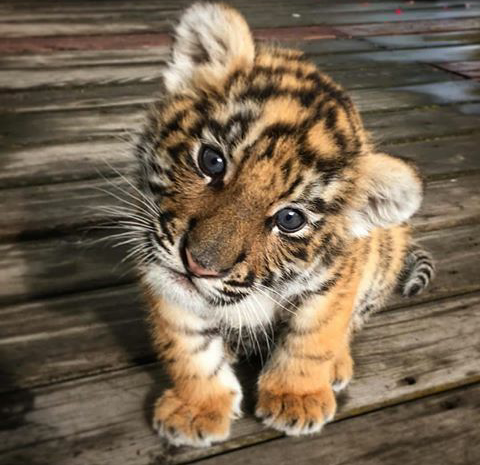

In [ ]:
## We have already seen how to split image channels in the first example.
## Here we would use cv2.split() function to do so.

cub=cv2.imread("/content/cub.png")
cv2_imshow(cub)

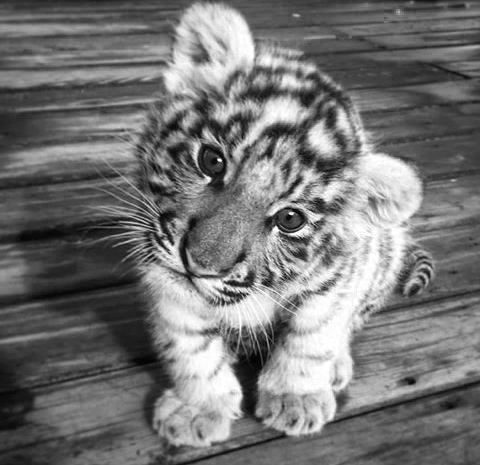

channel red


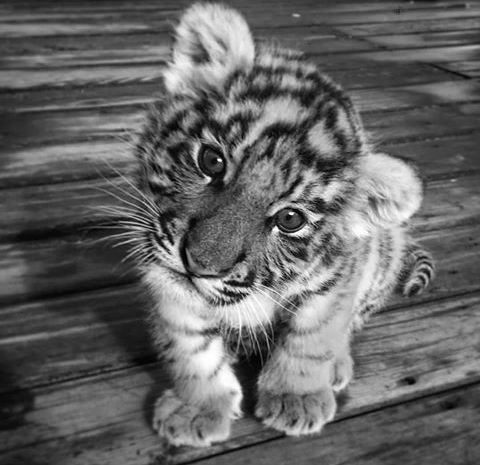

channel green


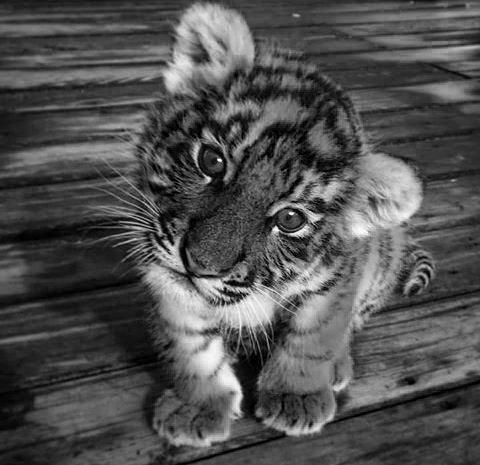

channel blue


In [ ]:
## splitting
(b,g,r) = cv2.split(cub)
## The splitting function returns three arrays - b,g and r arrays.
cv2_imshow( r)
print("channel red")
cv2_imshow( g)
print("channel green")
cv2_imshow( b)
print("channel blue")

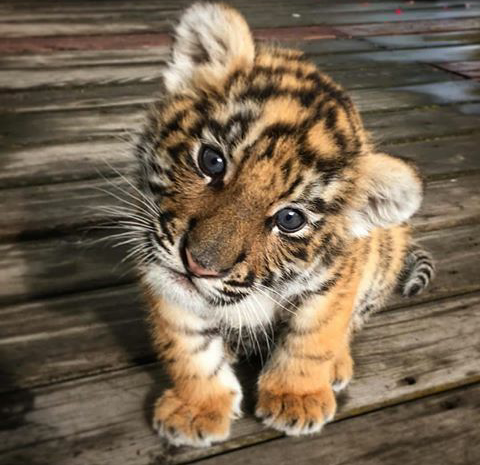

merged image


In [ ]:
## merging
merge = cv2.merge([b,g,r])
"""
we think of images in the RGB color space –
the red pixel first, the green pixel second, and the blue pixel
third. However, OpenCV stores RGB images as NumPy arrays in reverse channel order. 
Instead of storing an image in RGB order, it instead stores the image in BGR order; thus
we unpack the tuple in reverse order
"""
cv2_imshow(merge)
print("merged image")


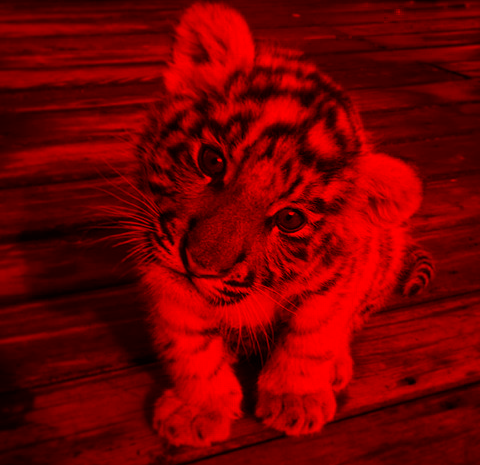

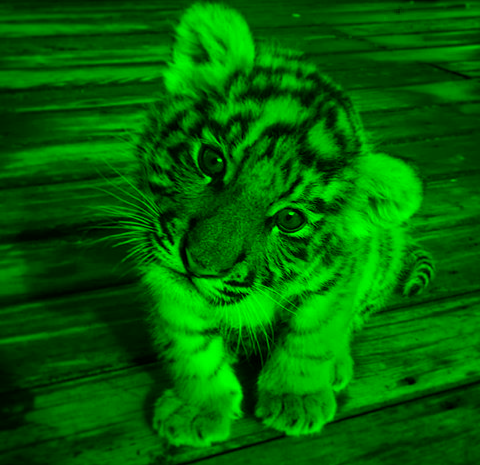

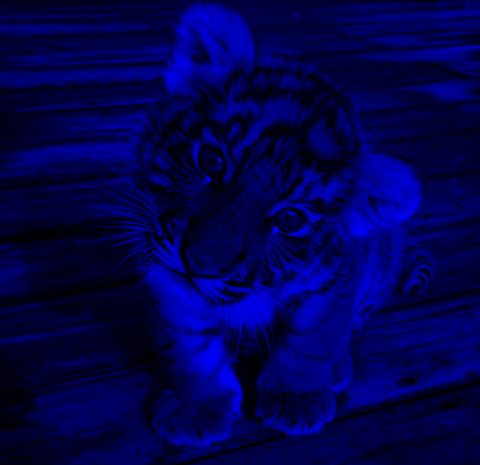

In [ ]:
## Visualizing channels in an image.
## Another method.
zeros = np.zeros(cub.shape[:2], dtype = "uint8")
cv2_imshow(cv2.merge([zeros, zeros, r]))
cv2_imshow(cv2.merge([zeros, g, zeros]))
cv2_imshow(cv2.merge([b, zeros, zeros]))


H I S T O G R A M S


Histogram represents the distribution of pixel intensities (whether color or grayscale) in an image. 
It can be visualized as a graph (or plot)that gives a high-level intuition of the intensity (pixel value) distribution. We are going to assume an RGB color space in this example, so these pixel values will be in the range of 0 to 255.

When plotting the histogram, the X-axis serves as our
“bins”. If we construct a histogram with 256 bins, then
we are effectively counting the number of times each pixel value occurs. In contrast, if we use only 2 (equally spaced) bins, then we are counting the number of times a pixel is in the range [0, 128) or [128, 255]. The number of pixels binned to the x-axis value is then plotted on the y-axis.

Function used -cv2.calcHist(images,channels,mask,histSize,ranges)
images -  image that we want to compute a histogram for. Wrap it as a list: [myImage],
channels -[0] for grayscale, ee red, green, and blue channels, the channels list would be [0,1,2] ,
mask - None if no mask,
histSize - the number of bins we want to use when computing a histogram,
ranges- 

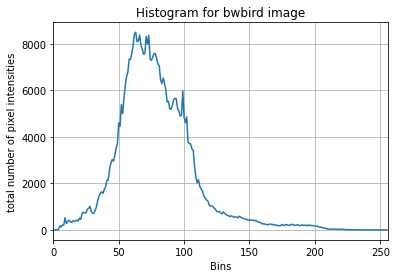

In [ ]:
## an example 

bwbird=cv2.imread("/content/bird.jpg",0)
hist = cv2.calcHist([bwbird], [0], None, [256], [0, 256])
plt.figure()
plt.title("Histogram for bwbird image")
plt.xlabel("Bins")
plt.ylabel("total number of pixel intensities")
plt.plot(hist)
plt.xlim([0, 256])
plt.grid()


In [ ]:
## can you make histogram of the colour image using any method learned already?
bird=cv2.imread("/content/bird.jpg")

In [ ]:
## define function for calculating histogram for RGB images.
def create_histogram(img_):
  (bc,gc,rc) = cv2.split(img_)
  histb = cv2.calcHist([bc], [0], None, [256], [0, 256])
  histg = cv2.calcHist([gc], [0], None, [256], [0, 256])
  histr = cv2.calcHist([rc], [0], None, [256], [0, 256])
  plt.figure(figsize=(12,8))
  plt.plot(histb, color='blue')
  plt.plot(histg, color='green')
  plt.plot(histr, color='red')
  plt.title("Histogram for RGB image")
  plt.xlabel("Bins")
  plt.ylabel("total number of pixel intensities")
  plt.grid()

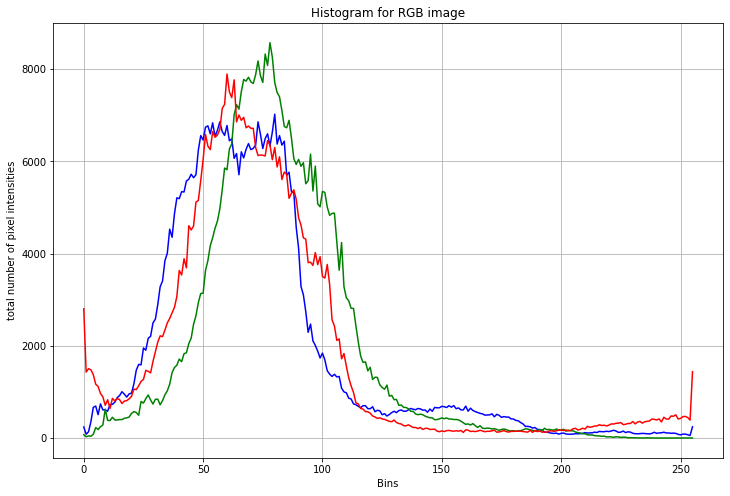

In [ ]:
create_histogram(bird)

Histogram equalization

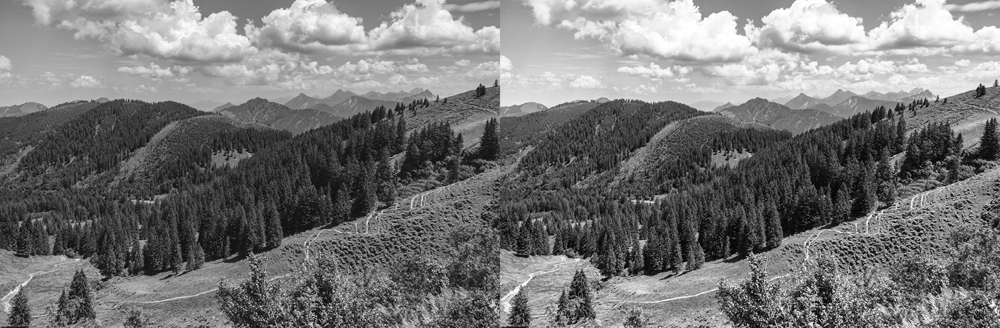

Image Vs Equalized image


In [ ]:
##  improves the contrast of an image
# by “stretching” the distribution of pixels.
mntn=cv2.imread("/content/mntn.jpg",0)
eqlz= cv2.equalizeHist(mntn)
cv2_imshow(np.hstack([mntn, eqlz]))
print("Image Vs Equalized image")

In [ ]:
## Home work: Do histogram equalization in RGB image.

BLURRING

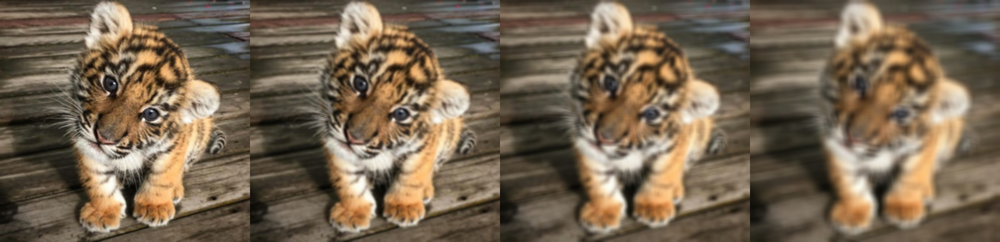

In [ ]:
cub=cv2.imread("/content/cub.png")
## technique used -- average blurr
blurred = np.hstack([cv2.blur(cub, (3, 3)), cv2.blur(cub, (5, 5)), cv2.blur(cub, (9, 9)), cv2.blur(cub, (15, 15))])
"""
As the name suggests, we are going to define a k × k sliding window on top of our image, where k is always an odd
number. This window is going to slide from left-to-right
and from top-to-bottom. The pixel at the center of this matrix (we have to use an odd number, otherwise there would
not be a true “center”) is then set to be the average of all
other pixels surrounding it
"""
cv2_imshow( blurred)


In [ ]:
## saving an image
cv2.imwrite("cubblurred.png", cv2.blur(cub, (15, 15)))
## You can see the image saved in the current working directory.

True

In [ ]:
# Other techniques
# cv2.GaussianBlur(image, (5, 5), 0)
# cv2.medianBlur(image, 5)
# cv2.bilateralFilter(image, 5, 27, 27)

###################################  THE END  #################################################